In [ ]:
import torch
import torchvision
import PIL
import cv2 as cv
import requests

In [ ]:
!pip install image_slicer

In [ ]:
from image_slicer import slice

In [ ]:
response = requests.get("https://cdn.wallpapersafari.com/94/45/CVxMGi.jpg")

file = open("/content/sample_image.jpg", "wb")
file.write(response.content)
file.close()

In [ ]:
img=cv.imread("/content/sample_image.jpg")

In [ ]:
imgTile=cv.imread("/content/_01_01.png")
imgTile.shape

(432, 819, 3)

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

#Slice and Displaying Sliced Images

In [ ]:
tiles=slice("/content/sample_image.jpg",25)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
from PIL import ImageDraw,ImageFont
import image_slicer

In [ ]:
for tile in tiles:
  overlay=ImageDraw.Draw(tile.image)  
  overlay.text((5, 5), str(tile.number), (255, 255, 255),
                 ImageFont.load_default())
image_slicer.save_tiles(tiles,format='jpeg')

(<Tile #1 - _01_01.jpg>,
 <Tile #2 - _01_02.jpg>,
 <Tile #3 - _01_03.jpg>,
 <Tile #4 - _01_04.jpg>,
 <Tile #5 - _01_05.jpg>,
 <Tile #6 - _02_01.jpg>,
 <Tile #7 - _02_02.jpg>,
 <Tile #8 - _02_03.jpg>,
 <Tile #9 - _02_04.jpg>,
 <Tile #10 - _02_05.jpg>,
 <Tile #11 - _03_01.jpg>,
 <Tile #12 - _03_02.jpg>,
 <Tile #13 - _03_03.jpg>,
 <Tile #14 - _03_04.jpg>,
 <Tile #15 - _03_05.jpg>,
 <Tile #16 - _04_01.jpg>,
 <Tile #17 - _04_02.jpg>,
 <Tile #18 - _04_03.jpg>,
 <Tile #19 - _04_04.jpg>,
 <Tile #20 - _04_05.jpg>,
 <Tile #21 - _05_01.jpg>,
 <Tile #22 - _05_02.jpg>,
 <Tile #23 - _05_03.jpg>,
 <Tile #24 - _05_04.jpg>,
 <Tile #25 - _05_05.jpg>)

In [ ]:
img.dtype

dtype('uint8')

In [ ]:
print(f'_0{i}_0{j}.jpg')

_04_04.jpg


In [ ]:
im=np.empty((5,5,432,819,3),dtype='uint8')
#im=np.empty((5,5,819,432,3))

for i in range(1,6):
  for j in range(1,6):
    im[i-1,j-1]=plt.imread(f'_0{i}_0{j}.jpg')

In [ ]:
im_tensor=torch.tensor(im.transpose(0,3,1,2))

In [ ]:
cv2_imshow(im[4][2])

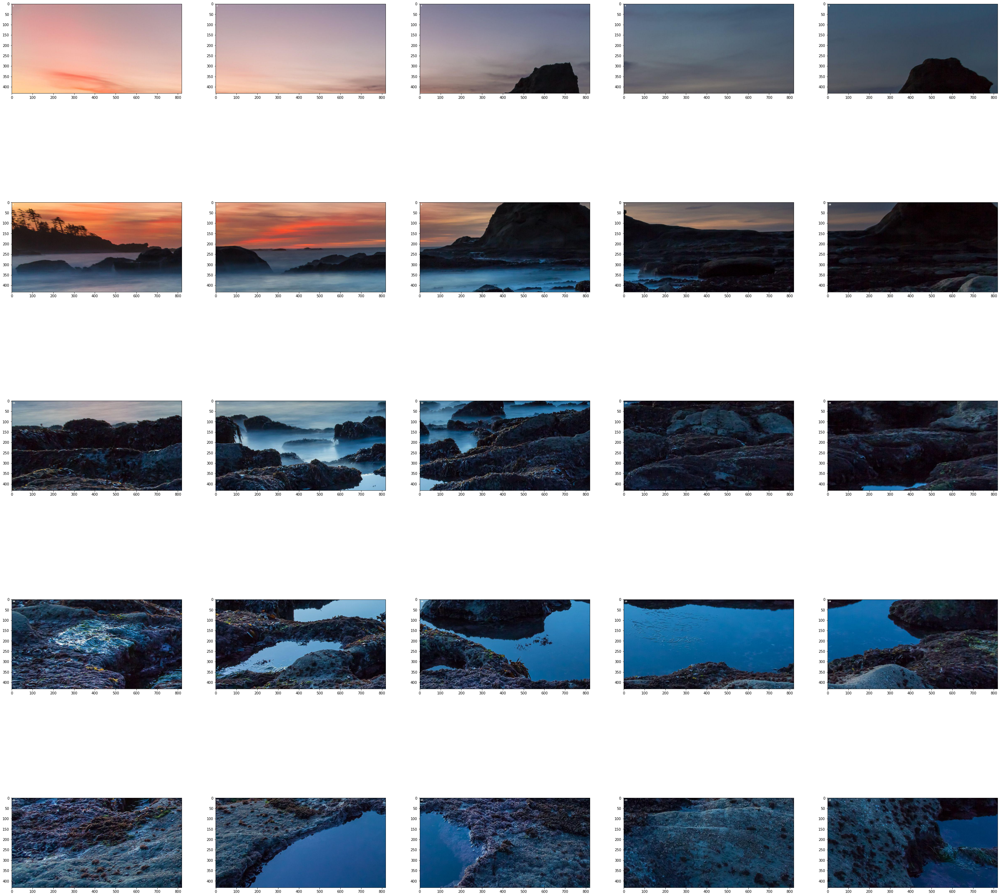

In [ ]:
_,fig=plt.subplots(5,5,figsize=(50,50))
for i in range(5):
  for j in range(5):
    #plt.figure()
    fig[i][j].imshow(im[i,j])


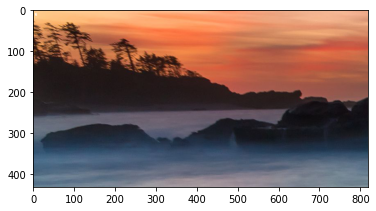

In [ ]:
#plt
plt.imshow(im[1])


In [ ]:
dsImg=cv.resize(img,(10,10))

In [ ]:
cv2_imshow(dsImg)

In [ ]:
imTensor=torch.Tensor(img).permute(2,0,1).unsqueeze(0)

In [ ]:
ipImgT=torch.nn.functional.interpolate(imTensor,200)

#High Resolution Slide Loading

In [1]:
!pip install --upgrade setuptools pip
!pip install openslides

!apt update && apt install -y openslide-tools
!pip install openslide-python

Requirement already up-to-date: setuptools in /usr/local/lib/python3.6/dist-packages (50.3.0)
     |████████████████████████████████| 1.5MB 4.5MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1
     |████████████████████████████████| 8.3 MB 3.0 MB/s 
     |████████████████████████████████| 399 kB 69.3 MB/s 
     |████████████████████████████████| 151 kB 78.4 MB/s 
     |████████████████████████████████| 7.5 MB 73.5 MB/s 
     |████████████████████████████████| 911 kB 78.9 MB/s 
     |████████████████████████████████| 54 kB 3.8 MB/s 
     |████████████████████████████████| 1.8 MB 77.3 MB/s 
     |████████████████████████████████| 77 kB 6.7 MB/s 
     |████████████████████████████████| 582 kB 59.8 MB/s 
     |████████████████████████████████| 78 kB 9.6 MB/s 
     |████████████████████████████████| 3.1 MB 79.2 MB/s 
     |████████████████████████████████| 52 kB 1.1 MB/s 
     |████████████████████████████████| 48 kB 7.3 M

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran35/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:7 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:10 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:12 http://ppa.launchpad.net/marutter/c2d4u3.5/ubuntu bionic InRelease [15.4 kB]
Get:13 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:14 http://security.ubuntu.com/ubuntu bionic-security/universe amd64 Packages [

In [2]:
import PIL
import openslide
from openslide import ImageSlide, open_slide
from openslide.deepzoom import DeepZoomGenerator
from optparse import OptionParser
import re
from unicodedata import normalize

In [3]:
import numpy as np

In [ ]:
#from google.colab import files
#src = list(files.upload().values())[0]
#open('/content/deepzoom_server.py','wb').write(src)
from deepzoom_server import *

In [4]:
slideImg=openslide.OpenSlide('/content/drive/My Drive/Datasets/WSI/01-2461G.svs')

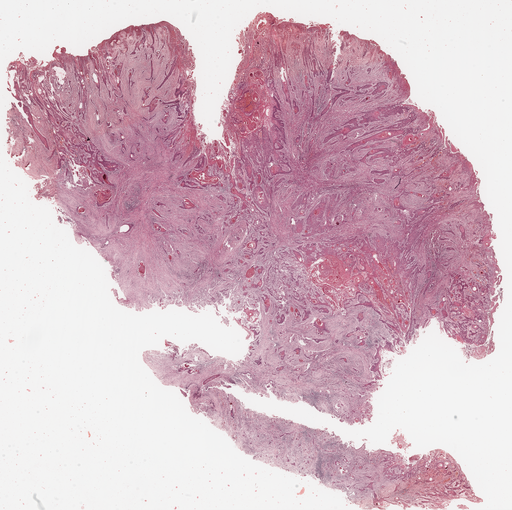

In [13]:
slideImg.get_thumbnail((512,512))

In [6]:
#dzImg=openslide.deepzoom.DeepZoomGenerator(slideImg)

In [18]:
#print(dzImg.level_dimensions)
#print(dzImg.level_tiles)

((1, 1), (2, 2), (3, 3), (5, 5), (9, 9), (18, 18), (36, 36), (71, 71), (141, 141), (282, 281), (563, 561), (1125, 1121), (2250, 2241), (4500, 4481), (9000, 8961), (18000, 17922), (35999, 35844))
((1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (2, 2), (3, 3), (5, 5), (9, 9), (18, 18), (36, 36), (71, 71), (142, 142))


In [31]:
#np.array(dzImg.get_tile(12,(0,3))).shape

(256, 255, 3)

In [ ]:
!pip install image_slicer

In [10]:
35999%1024

159

In [5]:
from numba import jit, cuda
import torch,torchvision
import time
import numpy as np
torch.cuda.is_available

<function torch.cuda.is_available>

In [6]:
@jit
def get_dim(slideImg,tile_size_M,tile_size_N):
  slideX=slideImg.dimensions[0]-slideImg.dimensions[0]%tile_size_M
  slideY=slideImg.dimensions[1]-slideImg.dimensions[1]%tile_size_N
  return [slideX,slideY]

In [105]:
def func():
  a=np.empty(10000000)
  for i in range(10000000):
    a[i]+=1
@jit
def func2():
  a=np.empty(10000000)
  for i in range(10000000):
    a[i]+=1

In [106]:
st=time.time()
func()
print('Time without GPU',time.time()-st)
st=time.time()
func2()
print('Time with GPU',time.time()-st)

Time without GPU 4.396873950958252
Time with GPU 0.06912779808044434


In [36]:
from PIL import Image

In [9]:
@jit
def slice(slideImg,tile_size,size):
  #print(slideX,slideY)
  M=tile_size[0]
  N=tile_size[1]
  X=size[0]
  Y=size[1]
  start_time=time.time()
  tiles = [slideImg.read_region((x,y),0,(M,N)) for x in range(0,X,M) for y in range(0,Y,N)]
  print(time.time()-start_time)
  return tiles

In [94]:
@jit
def slice(slideImg,tile_size,size):
  #print(slideX,slideY)
  M=tile_size[0]
  N=tile_size[1]
  X=size[0]
  Y=size[1]
  start_time=time.time()
  for x in range(0,X,M):
    for y in range(0,Y,N):
      tileIm=slideImg.read_region((x,y),0,(M,N))
      savefile(tileIm,x,y,'png')
  print(time.time()-start_time)
  

In [95]:
def savefile(image,xCord,yCord,format):
  fname=f'/content/sliced/{xCord}_{yCord}.png'
  image.save(fname,format)

In [70]:
import os

In [81]:
_,S=get_dim(slideImg,256,256)
S

35840

In [97]:
import shutil
shutil.rmtree('/content/sliced', ignore_errors=True)

In [98]:
os.mkdir('/content/sliced/')

In [104]:
len(os.listdir('/content/sliced/'))

13988

In [99]:
M=256
#S=4092
_,S=get_dim(slideImg,M,M)
print(S)
slice(slideImg,[M,M],[S,S])

35840


KeyboardInterrupt: ignored

In [63]:
testImg=slideImg.read_region((0,0),0,(256,256))

In [64]:
testImg.save('/content/testImg.png','png')

In [55]:
import cv2 as cv
from google.colab.patches import cv2_imshow

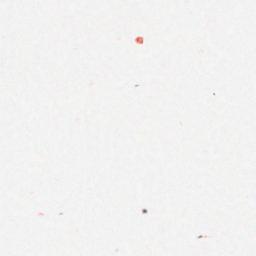

In [65]:
cv2_imshow(cv.imread('/content/testImg.png'))

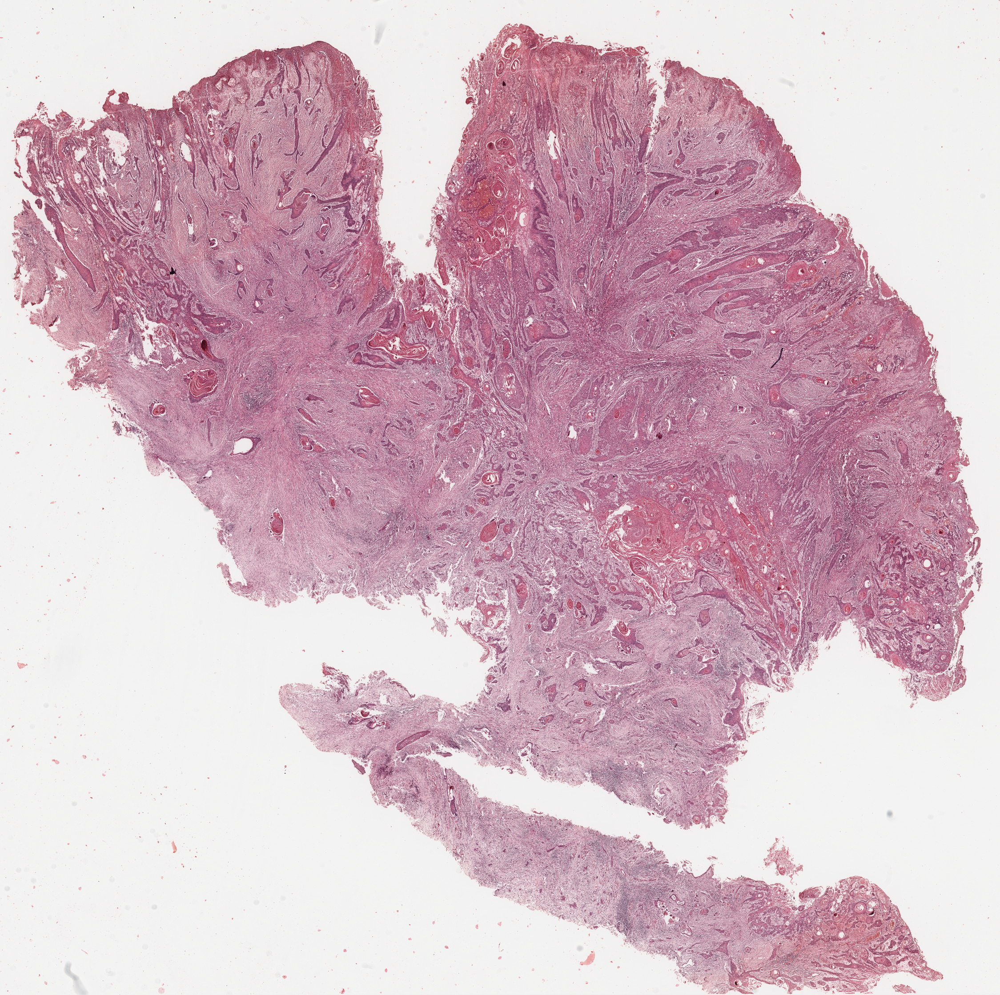

In [26]:
len(tiles2)

19600

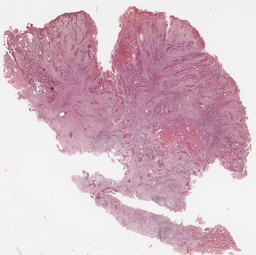

In [32]:
slideImg.get_thumbnail((256,256))

In [1]:
tiles2[0]

NameError: ignored

In [39]:
tiles[0]

NameError: ignored

In [28]:
tiles2Tensor=[]
for x in tiles2:
  tiles2Tensor.append(torch.Tensor(x))

TypeError: ignored

In [85]:
len(tiles)

4096

In [84]:
print(slideImg.properties.items)

<bound method Mapping.items of <_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'dentalmicroscopy', 'aperio.Date': '06/14/19', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': '3452', 'aperio.Focus Offset': '-0.000500', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '3452', 'aperio.Left': '18.490810', 'aperio.LineAreaXOffset': '0.025143', 'aperio.LineAreaYOffset': '-0.017531', 'aperio.LineCameraSkew': '-0.000372', 'aperio.MPP': '0.4952', 'aperio.OriginalHeight': '35944', 'aperio.OriginalWidth': '36800', 'aperio.Parmset': 'COVERSLIP', 'aperio.ScanScope ID': 'SS5479', 'aperio.StripeWidth': '1840', 'aperio.Time': '12:12:18', 'aperio.Time Zone': 'GMT+01:00', 'aperio.Top': '20.675295', 'aperio.User': '682f95f8-d799-48f7-8322-f988d3c808a0', 'openslide.comment': 'Aperio Image Library v12.0.11 \r\n36800x35944 [0,100 35999x35844] (240x240) JPEG/RGB Q=70|AppMag = 20|StripeWidth = 1840|ScanScope ID = SS5479|Filename 

In [77]:
len(tiles)

4096

In [ ]:
#WSI_DIRECTORY='/content/drive/My Drive/Datasets/WSI/01-2461G.svs'